## Часть 1

In [6]:
import vk, vk_api


In [7]:
from token import acess_token

In [8]:
vk_session = vk_api.VkApi(token = acess_token)
vk = vk_session.get_api()

In [9]:
users = vk.users.get(user_id = 221787814, fields = 'id, first_name, city, country, about')
users

[{'id': 221787814,
  'city': {'id': 1, 'title': 'Москва'},
  'country': {'id': 1, 'title': 'Россия'},
  'about': '',
  'first_name': 'Виталия',
  'last_name': 'Алексеева',
  'can_access_closed': True,
  'is_closed': False}]

In [10]:
import pandas as pd
df = pd.DataFrame(users)
df

,id,city,country,about,first_name,last_name,can_access_closed,is_closed
0,221787814,"{'id': 1, 'title': 'Москва'}","{'id': 1, 'title': 'Россия'}",,Виталия,Алексеева,True,False


In [11]:
df.to_csv('out.csv')

In [12]:
df.describe(include = 'all')

,id,city,country,about,first_name,last_name,can_access_closed,is_closed
count,1.0,1,1,1,1,1,1,1
unique,NaN,1,1,1,1,1,1,1
top,NaN,"{'id': 1, 'title': 'Москва'}","{'id': 1, 'title': 'Россия'}",,Виталия,Алексеева,True,False
freq,NaN,1,1,1,1,1,1,1
mean,221787814.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,221787814.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,221787814.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,221787814.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,221787814.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
import requests
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

In [14]:
def get_friends(token, user_id, with_name = False):
    fields = 'first_name,last_name' if with_name else ''
    url = 'https://api.vk.com/method/friends.get?' + \
                        'access_token={}&user_id={}&fields={}&v=5.81'.format(token,user_id, fields)
    response = requests.get(url).json()
    if response.get('error'):
        return []
    return response.get('response').get('items')

In [15]:
CENTRAL_USER_ID = 221787814

In [16]:
central_users = get_friends(acess_token, CENTRAL_USER_ID, True)

In [17]:
central_users = {user_dict['id']: user_dict.get('first_name') + \
                ' ' + user_dict.get('last_name')
                 for user_dict in central_users}

central_users[CENTRAL_USER_ID] = 'Я'

In [18]:
central_users

{3115302: 'Галина Крынецкая',
 3526840: 'Ольга Яковлева',
 22418960: 'Анна Рахимова',
 25052559: 'Иван Данильчук',
 27609546: 'Мария Базанова',
 28980725: 'Юрий Лопатин',
 100673144: 'Владислав Гвоздь',
 101558331: 'Виталий Лаврентьев',
 116652236: 'Андрей Андреев',
 140285282: 'Павел Максимов',
 143855825: 'Софья Базанова',
 147182760: 'Денис Егоров',
 150810764: 'Алёна Тарасова',
 152269198: 'Мария Щипанова',
 154205777: 'Варвара Николина',
 157350022: 'Анастасия Парфёнова',
 157530040: 'Степан Клычков',
 161066693: 'Мария Гумерова',
 161875669: 'Елена Хомко',
 171836664: 'Ангелина Иванова',
 172834606: 'Эдуард Почуев',
 182369679: 'Наталия Исакина',
 183249817: 'Надежда Анисимова',
 183430415: 'Владислав Петелин',
 188618581: 'Данил Горбушин',
 189697973: 'Маша Свищук',
 194428908: 'Тагир Закиров',
 199552642: 'Ян Емелин',
 200171457: 'Настя Бронина',
 213052708: 'Эллина Гарипова',
 213100029: 'Аскар Шаяхметов',
 221872254: 'Аделина Низамова',
 225287957: 'Диас Туралиев',
 226425109

In [19]:
import time
import random
graph = {}

for user_id in central_users.keys():
    graph[user_id] = get_friends(acess_token, user_id)
    time.sleep(random.randint(1, 10) / 100) 

In [20]:
uniqie_users = set(graph.keys())

In [21]:
g = nx.Graph()
for user_id, user_friends in graph.items():
    g.add_node(central_users[user_id])
    for friends_id in user_friends:
        if friends_id in central_users:
            g.add_edge(central_users[user_id], central_users[friends_id])

import scipy

In [22]:
def graph_plot():
    plt.figure(figsize=(12, 9))
    nx.draw_kamada_kawai(g, with_labels=False, node_size=50, width=0.5)
    plt.show()


In [23]:
g.remove_node(central_users[CENTRAL_USER_ID])

In [24]:
def graph_plot2():
    plt.figure(figsize=(12, 9))
    nx.draw_kamada_kawai(g, with_labels=True, node_size=50, width=0.5)
    plt.show()

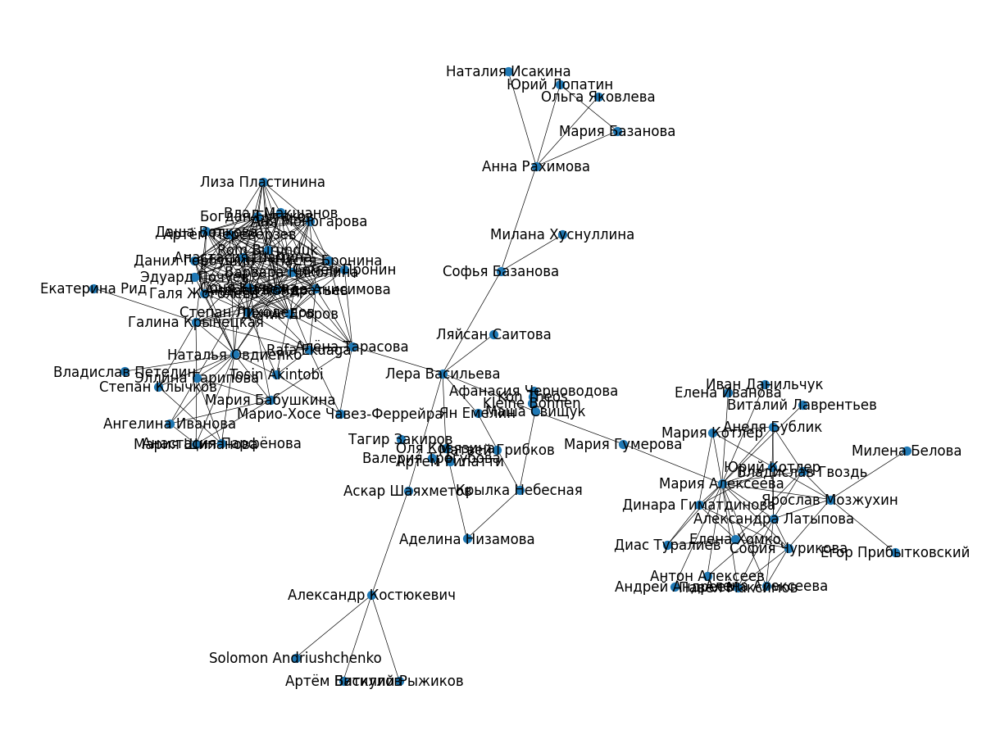

In [25]:
graph_plot2()

In [26]:
def graph_plot_save(name):
    plt.figure(figsize=(120, 90))
    nx.draw_kamada_kawai(g, with_labels=True, node_size=50, width=0.5)
    plt.savefig(name)

In [27]:
graph_plot_save('my_friends.png')

In [28]:
from IPython.display import Image
Image(filename='кластеры.png')

## Часть 2

In [29]:
frs = []

for num in central_users:
    us = vk.users.get(user_id = num, fields = 'id, first_name, city, country')
    if not 'deactivated' in us[0]:
        t = us[0]
        t['city'] = t['city']['title'] if 'city' in t else None
        frs.append(us[0])
    time.sleep(random.randint(1, 1000) / 1000)

In [30]:
df = pd.DataFrame(frs)
df.describe(include = 'all')
df['city'].value_counts()

city
Москва                     17
Уфа                        10
Санкт-Петербург             3
Berlin                      2
Минск                       1
Серпухов                    1
Thessaloniki                1
München                     1
Электросталь                1
Нижний Новгород             1
Саратов                     1
Магнитогорск                1
Актау                       1
Houston                     1
Пятигорск                   1
Глазов                      1
Набережные Челны            1
Альметьевск                 1
Сочи                        1
Новокузнецк                 1
Владимир                    1
Santa Cruz de la Sierra     1
Name: count, dtype: int64

In [31]:
df['city'].value_counts().to_csv('city.csv')

In [32]:
all_files = ["city.csv"]
df = pd.concat((pd.read_csv(f) for f in all_files), ignore_index=True)
ch_data = []
for el in df['city']:
    ch_data.append(el)
ch_data

['Москва',
 'Уфа',
 'Санкт-Петербург',
 'Berlin',
 'Минск',
 'Серпухов',
 'Thessaloniki',
 'München',
 'Электросталь',
 'Нижний Новгород',
 'Саратов',
 'Магнитогорск',
 'Актау',
 'Houston',
 'Пятигорск',
 'Глазов',
 'Набережные Челны',
 'Альметьевск',
 'Сочи',
 'Новокузнецк',
 'Владимир',
 'Santa Cruz de la Sierra']

In [35]:
API_KEY = 'bea8cc62-9f96-4fcb-ab91-db4c9dd35c95'
import requests
from dataclasses import dataclass

@dataclass
class YandexGeocoder:
    api_key: str
    geocoder_url: str = 'https://geocode-maps.yandex.ru/1.x'

    def adress_to_geopoint(self, address: str) -> str:
        """
        Преобразование адреса в геокоординаты в формате Datalens
        """
        response = requests.get(self.geocoder_url, params={
            'apikey': self.api_key,
            'geocode': address,
            'format': 'json',
        })
        response.raise_for_status()

        result = response.json()['response']['GeoObjectCollection']['featureMember']
        if not result:
            return None

        lat, lon = result[0]['GeoObject']['Point']['pos'].split(' ')
        return self._to_datalens_format(lon, lat)
    
    def _to_datalens_format(self, lon, lat):
        return f'[{lon},{lat}]'


geocoder = YandexGeocoder(api_key=API_KEY)
encoded_data = []
for adress in ch_data:
     s = geocoder.adress_to_geopoint(adress)
     encoded_data.append({'city': adress, 'coords': s})
encoded_data

[{'city': 'Москва', 'coords': '[55.755864,37.617698]'},
 {'city': 'Уфа', 'coords': '[54.735152,55.958736]'},
 {'city': 'Санкт-Петербург', 'coords': '[59.938784,30.314997]'},
 {'city': 'Berlin', 'coords': '[52.516259,13.377217]'},
 {'city': 'Минск', 'coords': '[53.902284,27.561831]'},
 {'city': 'Серпухов', 'coords': '[54.913681,37.416601]'},
 {'city': 'Thessaloniki', 'coords': '[40.632484,22.941041]'},
 {'city': 'München', 'coords': '[48.137193,11.575691]'},
 {'city': 'Электросталь', 'coords': '[55.78445,38.444858]'},
 {'city': 'Нижний Новгород', 'coords': '[56.326797,44.006516]'},
 {'city': 'Саратов', 'coords': '[51.533562,46.034266]'},
 {'city': 'Магнитогорск', 'coords': '[53.407163,58.980291]'},
 {'city': 'Актау', 'coords': '[43.635588,51.168245]'},
 {'city': 'Houston', 'coords': '[29.763701,-95.363192]'},
 {'city': 'Пятигорск', 'coords': '[44.039802,43.070643]'},
 {'city': 'Глазов', 'coords': '[58.140801,52.674253]'},
 {'city': 'Набережные Челны', 'coords': '[55.741272,52.403662]'},

In [36]:
df = pd.DataFrame(encoded_data)
df.describe(include = 'all')

df.to_csv('coords.csv')

# ДАШБОРД - https://datalens.yandex.ru/x4b9c9s5nf7cm-coords-dash '
# 'ДАТАЛЕНС КАРТА ГОРОДОВ ДРУЗЕЙ - https://datalens.yandex/kryu0qeki7vu9 '
# 'Связанная таблица https://datalens.yandex.ru/datasets/dkrjmilh5i5w2-coords'



## Часть 3

In [37]:
from datetime import date

def calculate_age(born):
    today = date.today()
    return today.year - born.year - ((today.month, today.day) < (born.month, born.day))


import datetime
 
# Function to convert string to datetime
def convert(date_time):
    date_time = date_time.split('.')
    if len(date_time[0]) < 2:
        date_time[0] = '0' + date_time[0]
    if len(date_time[1]) < 2:
        date_time[1] = '0' + date_time[1]
    date_time = ('.').join(date_time)
    format = '%d.%m.%Y'
    datetime_str = datetime.datetime.strptime(date_time, format)
 
    return datetime_str

In [38]:
import random

def get_random_people(token, of):
    url = 'https://api.vk.com/method/users.search?' + \
                        'access_token={}&offset={}&hometown=Москва&count=1000&fields=sex, bdate&v=5.81'.format(token, of)
    response = requests.get(url).json()
    if response.get('error'):
        return []
    return response.get('response').get('items')

random_people = get_random_people(acess_token, random.randint(1, 1000))

while len(random_people) < 10000:

    for i in get_random_people(acess_token, random.randint(1, 1000)):
        if i not in random_people:
            random_people.append(i)

for i in range(len(random_people)):
    if 'bdate' in random_people[i] and len(random_people[i]['bdate'].split('.')) == 3:
        random_people[i]['age'] = calculate_age(convert((random_people[i]['bdate'])))


In [39]:
df = pd.DataFrame(random_people)

In [40]:
df.to_csv('random_people.csv')

In [41]:

df['first_name'].value_counts()

first_name
Александр         383
Алексей           312
Андрей            246
Анастасия         231
Иван              231
                 ... 
Семён               2
Peter               1
Луиза-Габриэла      1
Аким                1
Самира              1
Name: count, Length: 323, dtype: int64

In [42]:
df['first_name'].value_counts().to_csv('random_people_count.csv')

rrr = {1: {}, 
      2: {}}

In [52]:
for el in random_people:
    if 'age' in el:
        if el['age'] in rrr[el['sex']]:
            rrr[el['sex']][el['age']] += 1
        else:
            rrr[el['sex']][el['age']] = 1

rrr

{1: {19: 101,
  21: 69,
  18: 45,
  23: 136,
  22: 135,
  122: 2,
  20: 189,
  45: 34,
  32: 45,
  24: 43,
  35: 37,
  26: 41,
  31: 18,
  38: 61,
  27: 64,
  49: 4,
  28: 71,
  41: 5,
  50: 21,
  29: 56,
  25: 29,
  61: 8,
  33: 51,
  37: 50,
  30: 28,
  34: 33,
  17: 32,
  54: 14,
  40: 15,
  55: 18,
  58: 20,
  15: 21,
  53: 22,
  43: 22,
  36: 22,
  52: 22},
 2: {20: 361,
  19: 171,
  25: 82,
  42: 49,
  24: 111,
  26: 51,
  55: 2,
  18: 35,
  46: 2,
  62: 3,
  39: 62,
  21: 273,
  22: 74,
  48: 37,
  65: 8,
  49: 22,
  31: 50,
  36: 93,
  28: 69,
  120: 4,
  37: 99,
  27: 78,
  51: 24,
  30: 75,
  34: 97,
  43: 54,
  29: 50,
  47: 83,
  44: 55,
  40: 30,
  33: 75,
  45: 8,
  32: 43,
  67: 10,
  23: 191,
  17: 11,
  35: 86,
  38: 88,
  61: 12,
  41: 12,
  63: 15,
  58: 37,
  52: 18,
  122: 57,
  121: 40,
  71: 19,
  54: 40,
  15: 42,
  94: 22}}

In [56]:
d = []
for el in rrr:
    for e in rrr[el]:
        d.append({'sex': el, 'age': e, 'count': rrr[el][e]})
df = pd.DataFrame(d)
df.to_csv('age_count.csv')

## 'ДАШБОРД https://datalens.yandex.ru/gnu1eolndlfu5-random-people-moscow'